In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.gridspec as gridspec
import spikeinterface as si
from mpl_toolkits.axes_grid1 import make_axes_locatable
from pathlib import Path
from data_analysis.mea_analysis import chans_to_coords, velocity_field, get_overview
from data_analysis.mea_analysis import get_stdf, filter_spikes_find_origin
from data_analysis.loading_and_saving import get_rec_obj

In [2]:
TUMORSLICEIMAGEPATH = "/media/ferdinand-forberger/Seagate Portable Drive/8561_5/org_image.png"
SHAMSLICEIMAGEPATH = "/media/ferdinand-forberger/Seagate Portable Drive/8606_2/org_image.png"
BRW_BASE_FOLDER = Path("/media/ferdinand-forberger/RawDataBackUp")
MAIN_FOLDER = Path("/media/ferdinand-forberger/Seagate Portable Drive")
IMAGE_SAVE_FOLDER = Path("plots")

In [ ]:
df_overview = get_overview(MAIN_FOLDER)
row_sham = df_overview[df_overview["folder"]=="8606_2"].iloc[0]
row_tumor = df_overview[df_overview["folder"]=="8561_5"].iloc[0]

In [4]:
tumor_image = plt.imread(TUMORSLICEIMAGEPATH)
sham_image = plt.imread(SHAMSLICEIMAGEPATH)

#sham
st_df_sham, st_sham, clu_sham, best_cha_st_sham, vectorized_map =  get_stdf(row_sham["folder_path"])
burst_json_path = Path(row_sham["folder_path"]) / "burst_params.json"
sles = np.load(row_sham["sle_path"])
image_path = Path(row_sham["folder_path"]) / Path("org_image.png")
recording_sham = get_rec_obj(row_sham["bin_path"])
#estimate sle origin and and filter spike sorted data
res = filter_spikes_find_origin(sles=sles,
                                            st=st_sham,
                                            clu=clu_sham,
                                            cluster_to_channel_map=vectorized_map, 
                                            burst_json_path=burst_json_path, 
                                            folder_path=row_sham["folder_path"])
estimated_SLE_orgins_sham, first_spikes, unique_chans_list, filtered_first_spikes_sham, filtered_chans_sham, chan_subsets = res

event_num_sham = 4
sham_origin = estimated_SLE_orgins_sham[event_num_sham]
x_coords_sham, y_coords_sham = chans_to_coords(filtered_chans_sham[event_num_sham])
x_coords_sham = x_coords_sham / 64 * 3.78 
y_coords_sham = y_coords_sham / 64 * 3.78

speed_sham, result_dict_sham = velocity_field(x_coords_sham, 
                                              y_coords_sham, 
                                              filtered_first_spikes_sham[event_num_sham])
grid_X_sham = result_dict_sham["grid_X"]
grid_Y_sham = result_dict_sham["grid_Y"]
time_surface_sham = result_dict_sham["time_surface"]
dir_x_sham = result_dict_sham["dir_x"]
dir_y_sham = result_dict_sham["dir_y"]

#tumor
st_df_tumor, st_tumor, clu_tumor, best_cha_st_tumor, vectorized_map =  get_stdf(row_tumor["folder_path"])
burst_json_path = Path(row_tumor["folder_path"]) / "burst_params.json"
sles = np.load(row_tumor["sle_path"])
image_path = Path(row_tumor["folder_path"]) / Path("org_image.png") 
recording_tumor = get_rec_obj(row_tumor["bin_path"])
#estimate sle origin and and filter spike sorted data
res = filter_spikes_find_origin(sles=sles,
                                            st=st_tumor,
                                            clu=clu_tumor,
                                            cluster_to_channel_map=vectorized_map, 
                                            burst_json_path=burst_json_path, 
                                            folder_path=row_tumor["folder_path"])
estimated_SLE_orgins_tumor, first_spikes, unique_chans_list, filtered_first_spikes, filtered_chans, chan_subsets = res

event_num_tumor = 1

tumor_origin = estimated_SLE_orgins_tumor[event_num_tumor]
x_coords_tumor, y_coords_tumor = chans_to_coords(filtered_chans[event_num_tumor])
x_coords_tumor = x_coords_tumor / 64 * 3.78 
y_coords_tumor = y_coords_tumor / 64 * 3.78

speed_tumor, result_dict_tumor = velocity_field(x_coords_tumor, 
                                              y_coords_tumor, 
                                              filtered_first_spikes[event_num_tumor])
grid_X_tumor = result_dict_tumor["grid_X"]
grid_Y_tumor = result_dict_tumor["grid_Y"]
time_surface_tumor = result_dict_tumor["time_surface"]
dir_x_tumor = result_dict_tumor["dir_x"]
dir_y_tumor = result_dict_tumor["dir_y"]    


Comparison of Labels (Original vs. Changed)
KSLabel agreement: 558, disagreement: 0
Number of good clusters (Original): 181
Number of good clusters (Changed): 181
-------------------------------------------------------
Comparison of Labels (Original vs. Changed)
KSLabel agreement: 558, disagreement: 0
Number of good clusters (Original): 181
Number of good clusters (Changed): 181
-------------------------------------------------------


100%|██████████| 558/558 [00:00<00:00, 1100.59it/s]


Comparison of Labels (Original vs. Changed)
KSLabel agreement: 554, disagreement: 0
Number of good clusters (Original): 119
Number of good clusters (Changed): 119
-------------------------------------------------------
Comparison of Labels (Original vs. Changed)
KSLabel agreement: 554, disagreement: 0
Number of good clusters (Original): 119
Number of good clusters (Changed): 119
-------------------------------------------------------


100%|██████████| 554/554 [00:00<00:00, 1694.04it/s]


In [5]:
heatmap_sham = np.full((4096), np.nan)
heatmap_sham[filtered_chans_sham[event_num_sham]] = filtered_first_spikes_sham[event_num_sham]
heatmap_sham = heatmap_sham.reshape((64,64))

heatmap_tumor = np.full((4096), np.nan)
heatmap_tumor[filtered_chans[event_num_tumor]] = filtered_first_spikes[event_num_tumor]
heatmap_tumor = heatmap_tumor.reshape((64,64))

In [6]:
transformed = np.load("data/transformed_acgs.npy")
labels = np.load("data/acg_labels.npy")
bin_centers = np.load("data/acg_bin_centers.npy")
acgs_0 = np.load("data/acgs_cluster0.npy")
acgs_1 = np.load("data/acgs_cluster1.npy")
acgs_2 = np.load("data/acgs_cluster2.npy")
df_ilr = pd.read_excel("data/ilr_coordinates.xlsx", index_col=0)

from data_analysis.plotting import get_c_map_colors
colors = get_c_map_colors()
import seaborn as sns

In [ ]:
import matplotlib.ticker as mticker
def format_y_ticks(x, pos):
    return f'{x:.2f}'
y_formatter = mticker.FuncFormatter(format_y_ticks)

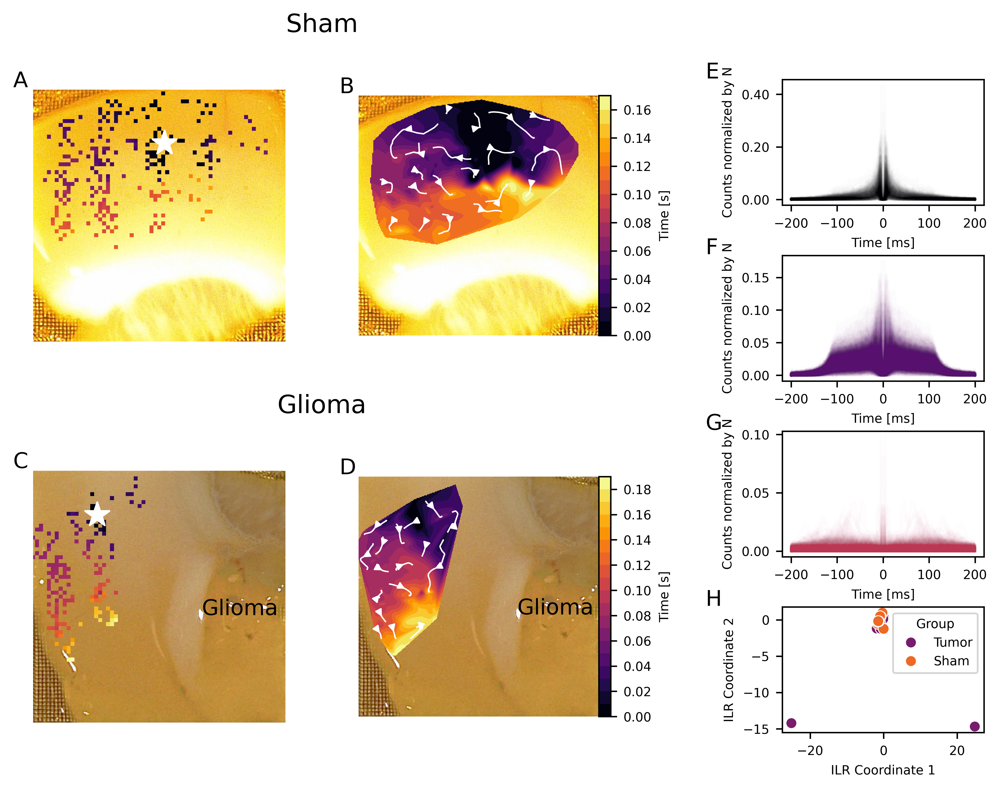

In [ ]:
cm = 1/2.54
plt.rcParams.update({'font.size': 7})

fig = plt.figure(figsize=(24*cm, 18*cm), dpi=600) #

gs = gridspec.GridSpec(4, 4, figure=fig,
                       height_ratios=[0.001, 1, 0.001, 1],
                       width_ratios=[1, 1, 0.1, 0.8]) 

vmin= 0
vmax = 0.19

time_surface_sham[time_surface_sham<vmin] = vmin
time_surface_sham[time_surface_sham>vmax] = vmax
time_surface_tumor[time_surface_tumor<vmin] = vmin
time_surface_tumor[time_surface_tumor>vmax] = vmax

ax_heatmapsham = fig.add_subplot(gs[1, 0])
ax_speedmapsham = fig.add_subplot(gs[1, 1])

ax_heatmaptumor = fig.add_subplot(gs[3, 0])
ax_speedmaptumor = fig.add_subplot(gs[3, 1])

ax_heading_sham = fig.add_subplot(gs[0, :2])
ax_heading_tumor = fig.add_subplot(gs[2, :2])

ax_heading_sham.text(0.5, 0.5, "Sham", fontsize=14, va='center', ha='center')
ax_heading_sham.set_axis_off()

ax_heatmapsham.imshow(sham_image, extent=[0, 64, 64, 0])
ax_heatmapsham.set_ylim(64, 0)
ax_heatmapsham.set_xlim(0, 64)
im = ax_heatmapsham.imshow(heatmap_sham, cmap="inferno", alpha=1, vmin=vmin, vmax=vmax)
ax_heatmapsham.scatter(sham_origin[0], sham_origin[1], color="white", marker="*", s=200)
ax_heatmapsham.set_axis_off()

ax_speedmapsham.imshow(sham_image, extent=[0, 3.8, 3.8, 0])
ax_speedmapsham.set_ylim(3.8, 0)
ax_speedmapsham.set_xlim(0, 3.8)
contour = ax_speedmapsham.contourf(grid_X_sham, grid_Y_sham, time_surface_sham, levels=20, cmap="inferno")
divider = make_axes_locatable(ax_speedmapsham)
cax = divider.append_axes("right", size="5%", pad=0)
cbar = fig.colorbar(contour, cax=cax)
cbar.set_label('Time [s]')
ax_speedmapsham.streamplot(grid_X_sham, grid_Y_sham, -dir_x_sham, -dir_y_sham, color='white', linewidth=0.8, arrowsize=0.8, density=0.3)
ax_speedmapsham.set_axis_off()

ax_heading_tumor.text(0.5, 0.5, "Glioma", fontsize=14, va='center', ha='center')
ax_heading_tumor.set_axis_off()

ax_heatmaptumor.imshow(tumor_image, extent=[0, 64, 64, 0])
ax_heatmaptumor.set_ylim(64, 0)
ax_heatmaptumor.set_xlim(0, 64)
im = ax_heatmaptumor.imshow(heatmap_tumor, cmap="inferno", alpha=1, vmin=0, vmax=0.19)
ax_heatmaptumor.scatter(tumor_origin[0], tumor_origin[1], color="white", marker="*", s=200)
ax_heatmaptumor.set_axis_off()

ax_speedmaptumor.imshow(tumor_image, extent=[0, 3.8, 3.8, 0])
ax_speedmaptumor.set_ylim(3.8, 0)
ax_speedmaptumor.set_xlim(0, 3.8)
contour = ax_speedmaptumor.contourf(grid_X_tumor, grid_Y_tumor, time_surface_tumor, levels=20, cmap="inferno")

divider = make_axes_locatable(ax_speedmaptumor)
cax = divider.append_axes("right", size="5%", pad=0)
cbar = fig.colorbar(contour, cax=cax)
cbar.set_label('Time [s]')
ax_speedmaptumor.streamplot(grid_X_tumor, grid_Y_tumor, -dir_x_tumor, -dir_y_tumor, color='white', linewidth=0.8, arrowsize=0.8, density=0.3)
ax_speedmaptumor.set_axis_off()

placeholder_column = fig.add_subplot(gs[:, 2])
placeholder_column.set_axis_off()

acg_heading = fig.add_subplot(gs[0, 3])
acg_heading.text(0.5, 0.5, "", fontsize=14, va='center', ha='center')
acg_heading.set_axis_off()
gs_new_column = gridspec.GridSpecFromSubplotSpec(4, 1, subplot_spec=gs[1:, 3])

ax_acg0 = fig.add_subplot(gs_new_column[0])
ax_acg1 = fig.add_subplot(gs_new_column[1])
ax_acg2= fig.add_subplot(gs_new_column[2])
ax_acg0.yaxis.set_major_formatter(y_formatter)
ax_acg1.yaxis.set_major_formatter(y_formatter)
ax_acg2.yaxis.set_major_formatter(y_formatter)

ax_ilr = fig.add_subplot(gs_new_column[3])

ax_acg0.plot(bin_centers, acgs_0.T, color=colors[0], alpha=0.01)
ax_acg0.set_xlabel("Time [ms]")
ax_acg0.set_ylabel("Counts normalized by N")

ax_acg1.plot(bin_centers, acgs_1.T, color=colors[1], alpha=0.01)
ax_acg1.set_xlabel("Time [ms]")
ax_acg1.set_ylabel("Counts normalized by N")

ax_acg2.plot(bin_centers, acgs_2.T, color=colors[2], alpha=0.01)
ax_acg2.set_xlabel("Time [ms]")
ax_acg2.set_ylabel("Counts normalized by N")

sns.scatterplot(
    ax=ax_ilr,
    data=df_ilr,
    x='ilr_coord_1',
    y='ilr_coord_2',
    hue='group',
    palette="inferno")
ax_ilr.set_xlabel('ILR Coordinate 1')
ax_ilr.set_ylabel('ILR Coordinate 2')
ax_ilr.legend(title='Group', fontsize=7)

alphabet = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
for i, ax in enumerate([ax_heatmapsham, 
                        ax_speedmapsham, 
                        ax_heatmaptumor, 
                        ax_speedmaptumor,
]):
    ax.text(-0.08, 1.01, alphabet[i], transform=ax.transAxes,fontsize=12)

alphabet = 'EFGHIJKLMNOPQRSTUVWXYZ'
for i, ax in enumerate([                        ax_acg0,
                        ax_acg1,
                        ax_acg2,
                        ax_ilr]):
    
    ax.text(-0.38, 1.01, alphabet[i], transform=ax.transAxes,fontsize=12)

ax_heatmaptumor.text(0.82, 0.45, "Glioma", fontsize=12, va='center', ha='center',
                      transform=ax_heatmaptumor.transAxes, zorder=100)
ax_speedmaptumor.text(0.82, 0.45, "Glioma", fontsize=12, va='center', ha='center',
                      transform=ax_speedmaptumor.transAxes, zorder=100)

plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.savefig(IMAGE_SAVE_FOLDER / "Figure 2.png", dpi=600, bbox_inches="tight")

plt.show()

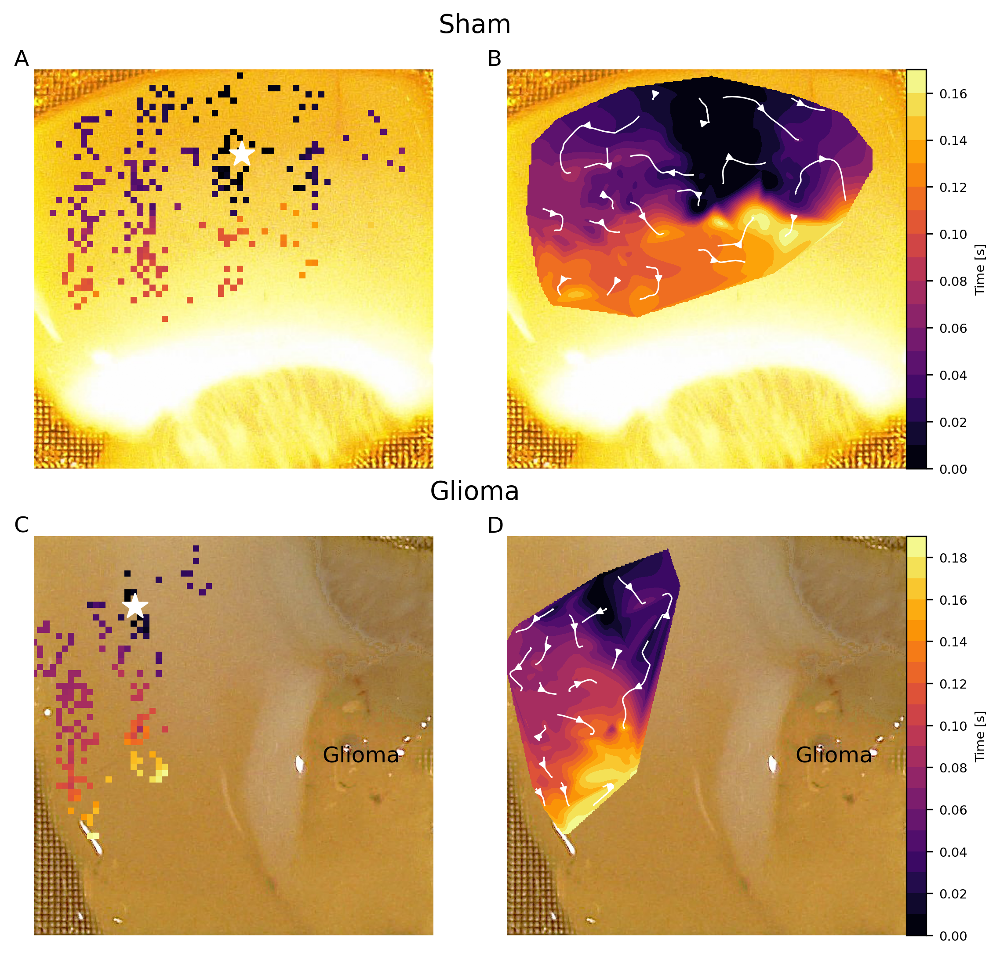

In [ ]:
cm = 1/2.54
plt.rcParams.update({'font.size': 7})
fig = plt.figure(figsize=(18*cm, 18*cm), dpi=600, layout='constrained')
gs = gridspec.GridSpec(4, 2, figure=fig,
                       height_ratios=[0.001,1,0.001,1],
                       width_ratios=[1, 1])
vmin= 0
vmax = 0.19

time_surface_sham[time_surface_sham<vmin] = vmin
time_surface_tumor[time_surface_tumor<vmin] = vmin

time_surface_sham[time_surface_sham>vmax] = vmax
time_surface_tumor[time_surface_tumor>vmax] = vmax

ax_heatmapsham = fig.add_subplot(gs[1, 0])
ax_speedmapsham = fig.add_subplot(gs[1, 1])

ax_heatmaptumor = fig.add_subplot(gs[3, 0])
ax_speedmaptumor = fig.add_subplot(gs[3, 1])

ax_heading_sham = fig.add_subplot(gs[0, :2])
ax_heading_tumor = fig.add_subplot(gs[2, :2])

ax_heading_sham.text(0.5, 0.5, "Sham", fontsize=14, va='center', ha='center')
ax_heading_sham.set_axis_off()


ax_heatmapsham.imshow(sham_image, extent=[0, 64, 64, 0])
ax_heatmapsham.set_ylim(64, 0)
ax_heatmapsham.set_xlim(0, 64)
im = ax_heatmapsham.imshow(heatmap_sham, cmap="inferno", alpha=1,vmin=vmin,
                                        vmax=vmax)
ax_heatmapsham.scatter(sham_origin[0], 
                       sham_origin[1], 
                       color="white", 
                       marker="*",
                       s=200)
ax_heatmapsham.set_axis_off()

ax_speedmapsham.imshow(sham_image, extent=[0, 3.8, 3.8, 0])
ax_speedmapsham.set_ylim(3.8, 0)
ax_speedmapsham.set_xlim(0, 3.8)
contour = ax_speedmapsham.contourf(grid_X_sham, 
                                   grid_Y_sham,
                                   time_surface_sham,
                                   levels=20,
                                   cmap="inferno")
divider = make_axes_locatable(ax_speedmapsham)
cax = divider.append_axes("right", size="5%", pad=0)
cbar = fig.colorbar(contour, cax=cax)
cbar.set_label('Time [s]')
ax_speedmapsham.streamplot(grid_X_sham, 
                           grid_Y_sham, 
                           -dir_x_sham, 
                           -dir_y_sham, 
                           color='white', 
                           linewidth=0.8,
                           arrowsize=0.8,
                           density=0.3,)
ax_speedmapsham.set_axis_off()


ax_heading_tumor.text(0.5, 0.5, "Glioma", fontsize=14, va='center', ha='center')
ax_heading_tumor.set_axis_off()

ax_heatmaptumor.imshow(tumor_image, extent=[0, 64, 64, 0])
ax_heatmaptumor.set_ylim(64, 0)
ax_heatmaptumor.set_xlim(0, 64)
im = ax_heatmaptumor.imshow(heatmap_tumor, cmap="inferno", alpha=1,
                            vmin=0,
                                        vmax=0.19)
ax_heatmaptumor.scatter(tumor_origin[0], 
                        tumor_origin[1], 
                        color="white", 
                        marker="*",
                        s=200)
ax_heatmaptumor.set_axis_off()

ax_speedmaptumor.imshow(tumor_image, extent=[0, 3.8, 3.8, 0])
ax_speedmaptumor.set_ylim(3.8, 0)
ax_speedmaptumor.set_xlim(0, 3.8)
contour = ax_speedmaptumor.contourf(grid_X_tumor, 
                                   grid_Y_tumor,
                                      time_surface_tumor,
                                      levels=20,
                                        cmap="inferno")

divider = make_axes_locatable(ax_speedmaptumor)
cax = divider.append_axes("right", size="5%", pad=0)
cbar = fig.colorbar(contour, cax=cax)
cbar.set_label('Time [s]')
ax_speedmaptumor.streamplot(grid_X_tumor, 
                           grid_Y_tumor, 
                           -dir_x_tumor, 
                           -dir_y_tumor, 
                           color='white', 
                           linewidth=0.8,
                           arrowsize=0.8,
                           density=0.3)
ax_speedmaptumor.set_axis_off()

alphabet = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
for i, ax in enumerate([ax_heatmapsham, ax_speedmapsham, ax_heatmaptumor, ax_speedmaptumor]):
    ax.text(-0.05, 1.01, alphabet[i], transform=ax.transAxes,fontsize=12)


ax_heatmaptumor.text(0.82, 0.45, 
                      "Glioma", 
                      fontsize=12, 
                      va='center', 
                      ha='center',
                      transform=ax_heatmaptumor.transAxes,
                      zorder=100
                      )
ax_speedmaptumor.text(0.82, 0.45, 
                      "Glioma", 
                      fontsize=12, 
                      va='center', 
                      ha='center',
                      transform=ax_speedmaptumor.transAxes,
                      zorder=100
                      )

plt.savefig(IMAGE_SAVE_FOLDER / "Figure_Event_Heatmaps_and_Speedmaps.png", 
            dpi=600,
            bbox_inches='tight')
plt.show()

In [ ]:
from data_analysis.mea_analysis import SAMPLING_RATE
from data_analysis.mea_analysis import get_std_bigger_pic

events_tumor = np.load(row_tumor["sle_path"])
events_sham = np.load(row_sham["sle_path"])

start_tumor = events_tumor[0, event_num_tumor]
start_sham = events_sham[0, event_num_sham]

end_tumor = start_tumor + int(0.18*SAMPLING_RATE)
end_sham = start_sham + int(0.18*SAMPLING_RATE)

In [ ]:
dur_sham = end_sham - start_sham
dur_tumor = end_tumor - start_tumor

In [ ]:
dur_ms_sham = (dur_sham / 9) / SAMPLING_RATE * 1000

In [ ]:
std_map_sham = get_std_bigger_pic(recording_sham, start_sham, end_sham,dur_ms_sham)
dur_ms_tumor = (dur_tumor / 9) / SAMPLING_RATE * 1000
std_map_tumor = get_std_bigger_pic(recording_tumor, start_tumor, end_tumor,dur_ms_tumor)

9 3
dt [s]: 0.019996177550315984, dt [ms]: 19.996177550315984
9 3
dt [s]: 0.019996177550315984, dt [ms]: 19.996177550315984


In [ ]:
from data_analysis.plotting import get_c_map_colors
colors = get_c_map_colors(5)

In [ ]:
from spikeinterface.preprocessing import highpass_filter
recording_tumor_filtered = highpass_filter(recording_tumor, freq_min=300)
recording_sham_filtered = highpass_filter(recording_sham, freq_min=300)

In [ ]:
from importlib import reload
import data_analysis.plotting
reload(data_analysis.plotting)
from data_analysis.plotting import plot_traces, add_scalarbars

Unique clusters for channel 799: [445]
Unique clusters for channel 1376: [336 337]
Unique clusters for channel 1246: [363]
Unique clusters for channel 1083: [380 381]
Unique clusters for channel 799: [445]
Unique clusters for channel 1376: [336 337]
Unique clusters for channel 1246: [363]
Unique clusters for channel 1083: [380 381]
Unique clusters for channel 846: [441]
Unique clusters for channel 1167: [374 375]
Unique clusters for channel 2001: [247]
Unique clusters for channel 2695: [116 117]
Unique clusters for channel 846: [441]
Unique clusters for channel 1167: [374 375]
Unique clusters for channel 2001: [247]
Unique clusters for channel 2695: [116 117]


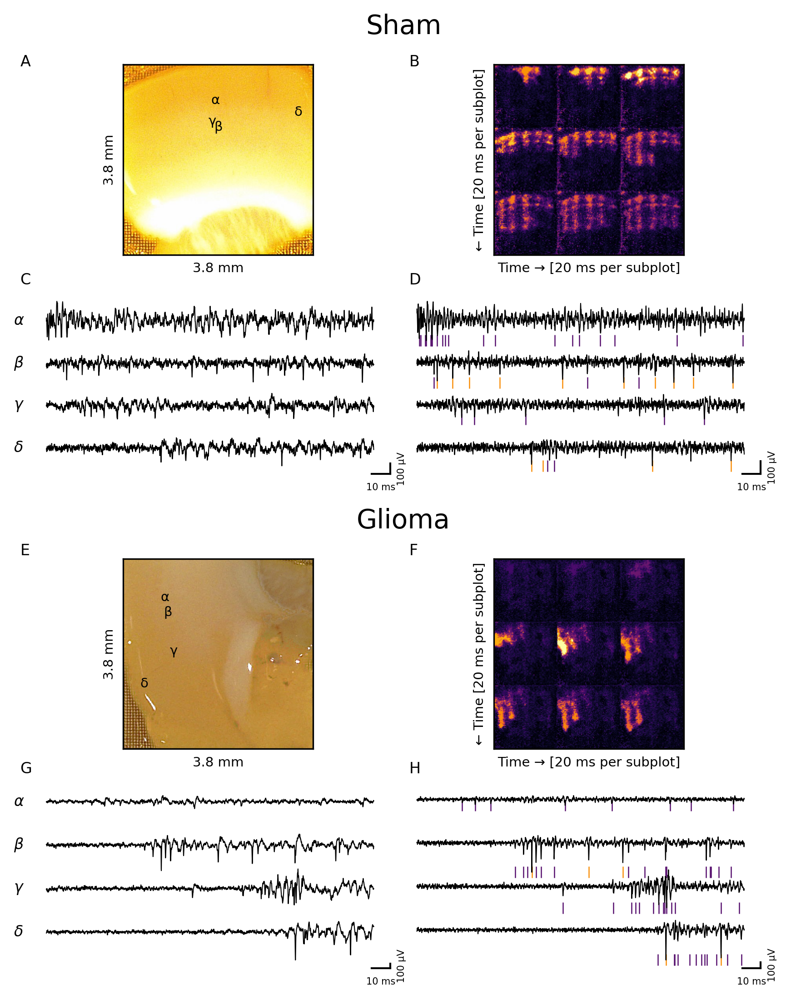

In [ ]:
cm = 1/2.54
plt.rcParams.update({'font.size': 7})
fig = plt.figure(figsize=(18*cm, 23*cm), dpi=300)
gs = gridspec.GridSpec(6, 2, figure=fig,
                       height_ratios=[0.001,1,1,0.001,1,1],
                       width_ratios=[1, 1])

ax_slice_sham = fig.add_subplot(gs[1, 0])
ax_slice_tumor = fig.add_subplot(gs[4, 0])

ax_std_map_sham = fig.add_subplot(gs[1, 1])
ax_std_map_tumor = fig.add_subplot(gs[4, 1])

ax_traces_sham = fig.add_subplot(gs[2, :1])
ax_traces_tumor = fig.add_subplot(gs[5, :1])

ax_traces_sham_filtered = fig.add_subplot(gs[2, 1])
ax_traces_tumor_filtered = fig.add_subplot(gs[5, 1])

channels_to_plot_sham = filtered_chans_sham[event_num_sham][[10, 30, 60, 130]]
channels_to_plot = filtered_chans[event_num_tumor][[10, 30, 60, 130]]
sham_x_coords, sham_y_coords = chans_to_coords(channels_to_plot_sham)
tumor_x_coords, tumor_y_coords = chans_to_coords(channels_to_plot)
greek_letters = ['α', 'β', 'γ', 'δ', 'ε', 'ζ', 'η', 'θ']

ax_slice_sham.imshow(sham_image, extent=[0, 64, 64, 0])
ax_slice_sham.set_aspect("equal") 
ax_slice_sham.set_xlabel("3.8 mm")
ax_slice_sham.set_ylabel("3.8 mm")
ax_slice_sham.set_xticklabels([])
ax_slice_sham.set_yticklabels([])
ax_slice_sham.set_yticks([])
ax_slice_sham.set_xticks([])
for i, chan in enumerate(channels_to_plot_sham):
    ax_slice_sham.text(sham_x_coords[i],
                        sham_y_coords[i],
                        greek_letters[i],
                        fontsize=7,
                        color="black",
                        ha='center',
                        va='center',
                        zorder=100)

ax_slice_tumor.imshow(tumor_image, extent=[0, 64, 64, 0])
ax_slice_tumor.set_aspect("equal") 
ax_slice_tumor.set_xlabel("3.8 mm")
ax_slice_tumor.set_ylabel("3.8 mm")
ax_slice_tumor.set_xticklabels([])
ax_slice_tumor.set_yticklabels([])
ax_slice_tumor.set_yticks([])
ax_slice_tumor.set_xticks([])
for i, chan in enumerate(channels_to_plot):
    ax_slice_tumor.text(tumor_x_coords[i],
                        tumor_y_coords[i],
                        greek_letters[i],
                        fontsize=7,
                        color="black",
                        ha='center',
                        va='center',
                        zorder=100)

ax_std_map_sham.imshow(std_map_sham, cmap="inferno")
ax_std_map_sham.set_aspect("equal") 
ax_std_map_sham.set_xlabel("Time → [20 ms per subplot]")
ax_std_map_sham.set_ylabel("← Time [20 ms per subplot]")
ax_std_map_sham.set_xticklabels([])
ax_std_map_sham.set_yticklabels([])
ax_std_map_sham.set_yticks([])
ax_std_map_sham.set_xticks([])

ax_std_map_tumor.imshow(std_map_tumor, cmap="inferno")
ax_std_map_tumor.set_aspect("equal") 
ax_std_map_tumor.set_xlabel("Time → [20 ms per subplot]")
ax_std_map_tumor.set_ylabel("← Time [20 ms per subplot]")
ax_std_map_tumor.set_xticklabels([])
ax_std_map_tumor.set_yticklabels([])
ax_std_map_tumor.set_yticks([])
ax_std_map_tumor.set_xticks([])



plot_traces(ax=ax_traces_sham,
            start_idx=start_sham,
            end_idx=end_sham,
            st=st_sham,
            chans=channels_to_plot_sham,
            recording=recording_sham,
            sampling_rate=SAMPLING_RATE,
            best_cha_st=best_cha_st_sham,
            clu=clu_sham,
            colors=np.array(colors)[[1,2,3]].tolist(),
            letters=True,
            markers=False,
            marker="|",
            linewidths=0.4,
            zorder=0)
ax_traces_sham.set_axis_off()

plot_traces(ax=ax_traces_sham_filtered,
            start_idx=start_sham,
            end_idx=end_sham,
            st=st_sham,
            chans=channels_to_plot_sham,
            recording=recording_sham_filtered,
            sampling_rate=SAMPLING_RATE,
            best_cha_st=best_cha_st_sham,
            clu=clu_sham,
            letters=False,
            colors=np.array(colors)[[1,2,3]].tolist(),
            marker="|",
            linewidths=0.6,
            zorder=0)
ax_traces_sham.set_axis_off()

plot_traces(ax=ax_traces_tumor,
            start_idx=start_tumor,
            end_idx=end_tumor,
            st=st_tumor,
            chans=channels_to_plot,
            recording=recording_tumor,
            sampling_rate=SAMPLING_RATE,
            best_cha_st=best_cha_st_tumor,
            clu=clu_tumor,
            colors=np.array(colors)[[1,2,3]].tolist(),
            markers=False,
            marker="|",
            zorder=10)

plot_traces(ax=ax_traces_tumor_filtered,
            start_idx=start_tumor,
            end_idx=end_tumor,
            st=st_tumor,
            chans=channels_to_plot,
            recording=recording_tumor_filtered,
            sampling_rate=SAMPLING_RATE,
            best_cha_st=best_cha_st_tumor,
            clu=clu_tumor,
            letters=False,
            colors=np.array(colors)[[1,2,3]].tolist(),
            marker="|",
            alpha=1,
            linewidths=0.6,
            zorder=0)

traces_axes = [ax_traces_sham, ax_traces_sham_filtered, ax_traces_tumor, ax_traces_tumor_filtered]
for ax in traces_axes:
    add_scalarbars(ax,
                x_size=0.01,
                y_size=100,
                x_corner_offset=0,
                y_corner_offset=0,
                x_label="10 ms",
                y_label="100 µV",
                fontsize=5,
                linewidth=1)

ax_traces_tumor.set_axis_off()
ax_traces_sham_filtered.set_axis_off()
ax_traces_tumor_filtered.set_axis_off()

ax_heading_sham = fig.add_subplot(gs[0, :2])
ax_heading_tumor = fig.add_subplot(gs[3, :2])
ax_heading_sham.text(0.5, 1, "Sham", fontsize=14, va='center', ha='center')
ax_heading_sham.set_axis_off()
ax_heading_tumor.text(0.5, 0.5, "Glioma", fontsize=14, va='center', ha='center')
ax_heading_tumor.set_axis_off()
alphabet = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'




letters = 'ABCDEFGH' 

x_offset = -0.015
y_offset = 0.02 
letters_fontsize = 8

ax_slice_sham_letter_x = ax_slice_sham.get_position().x0 -0.08
ax_traces_sham_letter_x = ax_slice_sham_letter_x
ax_slice_tumor_letter_x = ax_slice_sham_letter_x
ax_traces_tumor_letter_x = ax_slice_sham_letter_x

ax_std_map_sham_letter_x = ax_std_map_sham.get_position().x0 -0.1
ax_traces_sham_filtered_letter_x = ax_std_map_sham_letter_x
ax_std_map_tumor_letter_x = ax_std_map_sham_letter_x
ax_traces_tumor_filtered_letter_x = ax_std_map_sham_letter_x

ax_slice_sham_letter_y = ax_slice_sham.get_position().y1 -0.01
ax_std_map_sham_letter_y = ax_slice_sham_letter_y

ax_traces_sham_letter_y = ax_traces_sham.get_position().y1 
ax_traces_sham_filtered_letter_y = ax_traces_sham_letter_y

ax_slice_tumor_letter_y = ax_slice_tumor.get_position().y1 -0.01
ax_std_map_tumor_letter_y = ax_slice_tumor_letter_y

ax_traces_tumor_letter_y = ax_traces_tumor.get_position().y1 
ax_traces_tumor_filtered_letter_y = ax_traces_tumor_letter_y


fig.text(ax_slice_sham_letter_x , 
                   ax_slice_sham_letter_y,
                   "A",
                   fontsize=letters_fontsize,
                   transform =fig.transFigure)
fig.text(ax_std_map_sham_letter_x , 
         ax_std_map_sham_letter_y,
         "B",
         fontsize=letters_fontsize,
         transform =fig.transFigure)
fig.text(ax_traces_sham_letter_x , 
                   ax_traces_sham_letter_y,
                   "C",
                   fontsize=letters_fontsize,
                   transform =fig.transFigure)
fig.text(ax_traces_sham_filtered_letter_x , 
                   ax_traces_sham_filtered_letter_y,
                   "D",
                   fontsize=letters_fontsize,
                   transform =fig.transFigure)
fig.text(ax_slice_tumor_letter_x , 
                   ax_slice_tumor_letter_y,
                   "E",
                   fontsize=letters_fontsize,
                   transform =fig.transFigure)
fig.text(ax_std_map_tumor_letter_x ,
                     ax_std_map_tumor_letter_y,
                     "F",
                     fontsize=letters_fontsize,
                     transform =fig.transFigure)
fig.text(ax_traces_tumor_letter_x , 
                   ax_traces_tumor_letter_y,
                   "G",
                   fontsize=letters_fontsize,
                   transform =fig.transFigure)
fig.text(ax_traces_tumor_filtered_letter_x , 
                   ax_traces_tumor_filtered_letter_y,
                   "H",
                     fontsize=letters_fontsize,
                     transform =fig.transFigure)

plt.subplots_adjust(wspace=-0.02, hspace=0.3)
plt.savefig(IMAGE_SAVE_FOLDER / "Figure_Event_Std_and_Traces.png", 
            dpi=600,
            bbox_inches='tight')
plt.show()